In [67]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import keras_preprocessing
import neural_structured_learning as nsl
import tensorflow as tf
import tensorflow_datasets.public_api as tfds
import zipfile

from tensorflow.keras import models
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

# create image embeddings
import create_embeding_func
from create_embeding_func import create_embeddings, create_records, make_dataset

In [2]:
import matplotlib.pyplot as plt
import numpy as np

import neural_structured_learning as nsl

import tensorflow as tf
import tensorflow_datasets as tfds

# Resets notebook state
tf.keras.backend.clear_session()

tfds.disable_progress_bar()

# disable warnings
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print(
  "GPU is",
  "available" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE")

Version:  2.8.0
Eager mode:  True
GPU is available


### Flowers Dataset

In [3]:
dataset = 'tf_flowers'#@param
#trainset, validationset, test-set, metadata
(train_ds, validation_ds, test_ds), dataset_info = tfds.load('tf_flowers',
                                        split=['train[:30%]', 'train[80%:90%]', 'train[90%:]'],
                                         with_info=True,
                                         as_supervised=True,
                                                 )

In [4]:
num_classes = dataset_info.features['label'].num_classes
num_classes

5

In [5]:
num_train_examples = 0
num_val_examples = 0
num_test_examples = 0
for example in train_ds:
    num_train_examples += 1
for example in validation_ds:
    num_val_examples += 1
for example in test_ds:
    num_test_examples += 1
print('Total Number of Classes: {}'.format(num_classes))
print('Total Number of Training Images: {}'.format(num_train_examples))
print('Total Number of Validation Images: {} \n'.format(num_val_examples))
print('Total Number of Test Images: {} \n'.format(num_test_examples))

Total Number of Classes: 5
Total Number of Training Images: 1101
Total Number of Validation Images: 367 

Total Number of Test Images: 367 



In [6]:
# Load images, define train, test and dict keys
IMAGE_INPUT_NAME = 'image'
LABEL_INPUT_NAME = 'label'

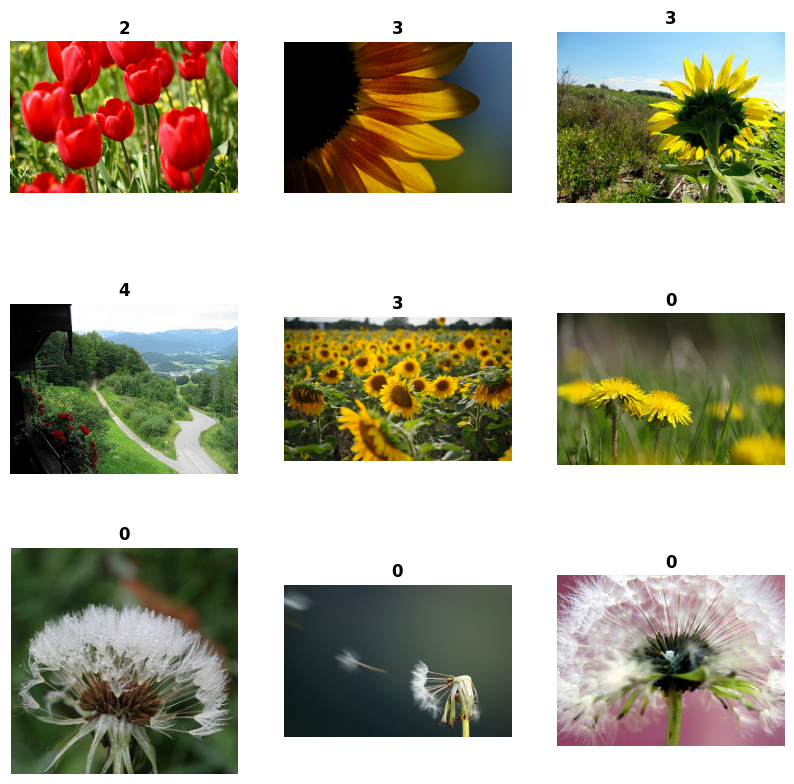

In [7]:
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.title(int(label))
  plt.axis("off")

In [63]:
CLASSES = 'dandelion', 'daisy', 'tulips', 'sunflowers', 'roses'


In [65]:
#hyperparams
IMG_SIZE=224 #224
BATCH_SIZE = 48
PROJECTED_DIM = 128
original_dim = 1024

In [9]:
def resize(image, label):
  """Resizes the images to (IMG_SIZE x IMG_SIZE) size."""
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  return image, label

# Resize all the images to uniform shape so that they can
# be batched.
train = train_ds.map(resize)
validation = validation_ds.map(resize)
test = test_ds.map(resize)

In [10]:
#@title Preprocessing 
def normalize(features):
  features[IMAGE_INPUT_NAME] = tf.cast(
      features[IMAGE_INPUT_NAME], dtype=tf.float32) / IMG_SIZE
  return features

def examples_to_tuples(features):
  return features[IMAGE_INPUT_NAME], features[LABEL_INPUT_NAME]

def examples_to_dict(image, label):
  return {IMAGE_INPUT_NAME: image, LABEL_INPUT_NAME: label}

def resize(image, label):
  """Resizes the images to (IMG_SIZE x IMG_SIZE) size."""
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  return image, label



In [64]:
PROJECTED_DIM = 128 #128 #@param {type:"slider", min:128, max:1024, step:128}

In [12]:
def create_feature_extractor_model():
  """Creates a feature extractor model with DenseNet121."""
  inputs = tf.keras.layers.Input((IMG_SIZE, IMG_SIZE, 3))
  
  densenet_model = tf.keras.applications.DenseNet121(weights="imagenet", 
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    pooling="avg", include_top=False
  )
  densenet_model.trainable = False
  x = tf.keras.applications.densenet.preprocess_input(inputs)
  outputs = densenet_model(x, training=False)

  return tf.keras.Model(inputs, outputs, name="densenet_feature_extractor")

In [13]:
feature_extractor = create_feature_extractor_model()
feature_extractor.summary()

Model: "densenet_feature_extractor"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 densenet121 (Functional)    (None, 1024)              7037504   
                                                                 
Total params: 7,037,504
Trainable params

In [14]:
class HParams(object):
  """Hyperparameters used for training."""
  def __init__(self):
    ### dataset parameters
    self.num_classes = 5
    self.num_train_examples = num_train_examples
    self.num_val_examples = num_val_examples
    
    ### neural graph learning parameters
    self.distance_type = nsl.configs.DistanceType.L2
    self.graph_regularization_multiplier = 0.1 #0.3
    self.num_neighbors = 2 #4 #2

    ### network architecture parameters
    self.num_channels = 8 #16  #32
    self.kernel_size = 3 #3
    
    ### training parameters
    self.train_epochs = 20
    self.batch_size = 48 
    
    ### eval parameters
    self.eval_steps = None  # All instances in the test set are evaluated.

HPARAMS = HParams()

In [15]:
default_jpeg_value = tf.ones((IMG_SIZE, IMG_SIZE, 3), dtype=tf.uint8)    #dtype=tf.uint8
default_jpeg_value *= 255 #255
default_jpeg_value = tf.image.encode_jpeg(default_jpeg_value, optimize_size=True,
                                         chroma_downsampling=False)

In [16]:
# preparing datasets for pre-trained embedding generator

train_set = train.map(examples_to_dict)
train_set = train_set.map(examples_to_tuples).map(resize)

test_set = test.map(examples_to_dict)
test_set = test_set.map(examples_to_tuples).map(resize)

val_set = validation.map(examples_to_dict)
val_set = val_set.map(normalize).map(examples_to_tuples)

In [37]:
train_set_n = train.map(examples_to_dict)
train_set_n = train_set_n.map(normalize)
train_set_n = train_set_n.map(examples_to_tuples)

In [38]:
validation_set_n = validation.map(examples_to_dict)
validation_set_n = validation_set_n.map(normalize)
validation_set_n = validation_set_n.map(examples_to_tuples)

In [68]:
%%time

create_embeddings(train_set, "flowers_embeddings.tfr",original_dim,PROJECTED_DIM, 0)

CPU times: total: 12min 23s
Wall time: 2min 24s


1101

In [73]:
####### MAKE DATASET FOR GRAPH REGULARIZATION
similarity_threshold = 0.65 
lsh_splits=10
lsh_rounds=15

graph_builder_config = nsl.configs.GraphBuilderConfig(
    similarity_threshold=similarity_threshold, 
    lsh_splits=10, lsh_rounds=15, random_seed=12345)             # 10 and 15
nsl.tools.build_graph_from_config(["flowers_embeddings.tfr"],
                                  "flowers_embeddings.tsv",
                                  graph_builder_config)
#############################################################################

next_record_id = create_records(train_ds, "train_data.tfr", 0)

create_records(validation_ds, "validation_data.tfr",   #adv_dataset_val2  #val_data2
               next_record_id)

###################################################################################
nsl.tools.pack_nbrs(
    "train_data2.tfr",
    "",
    "flowers_embeddings.tsv",
    "nsl_train_data2.tfr",
    add_undirected_edges=True,
    max_nbrs=3
)

num_train = tf.data.experimental.cardinality(train_ds)
num_val = tf.data.experimental.cardinality(validation_ds)
print(f"Total training examples: {num_train}")
print(f"Total validation examples: {num_val}")

train_data_clean = make_dataset('nsl_train_data.tfr', BATCH_SIZE, num_train,True)
validation_dataset_clean = make_dataset('validation_data.tfr', BATCH_SIZE, num_train)



Total training examples: 1101
Total validation examples: 367


In [74]:
sample = next(iter(train_data2))
sample[0].keys()

dict_keys(['NL_nbr_0_image', 'NL_nbr_0_weight', 'NL_nbr_1_image', 'NL_nbr_1_weight', 'image'])

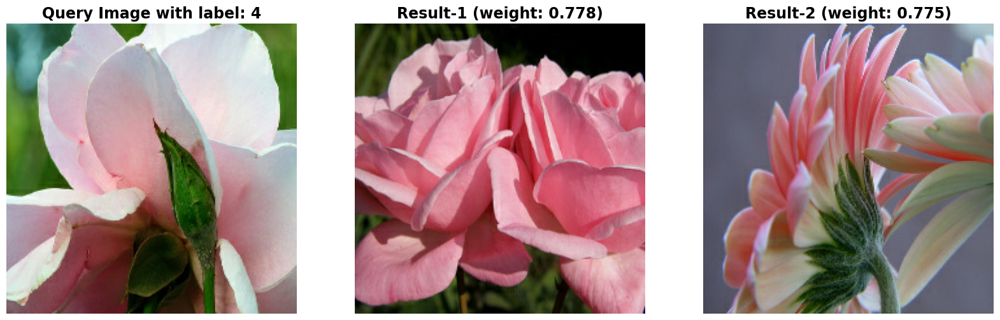

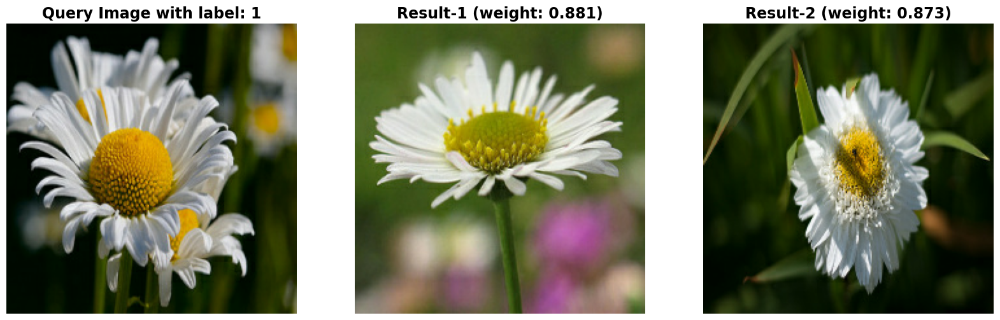

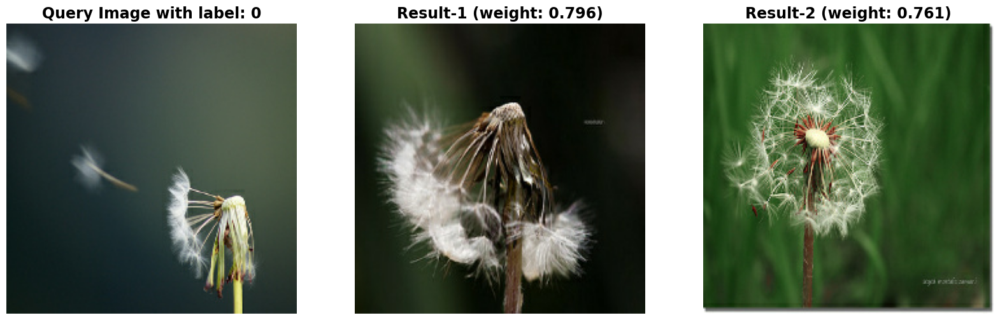

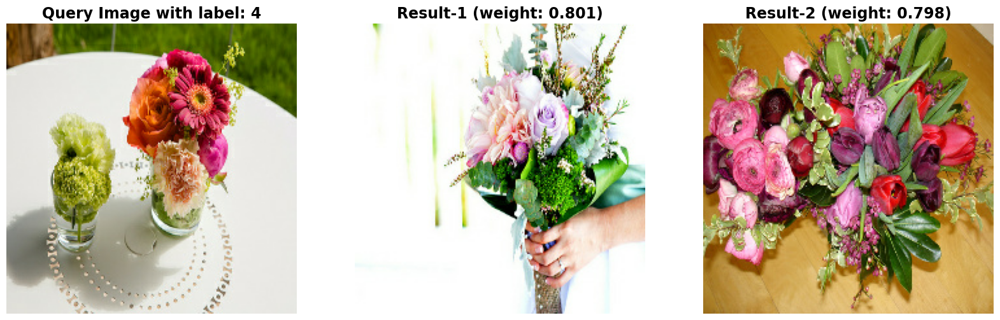

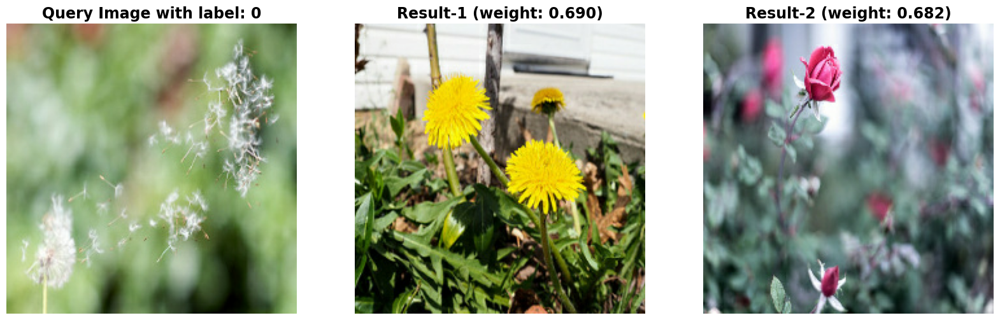

...

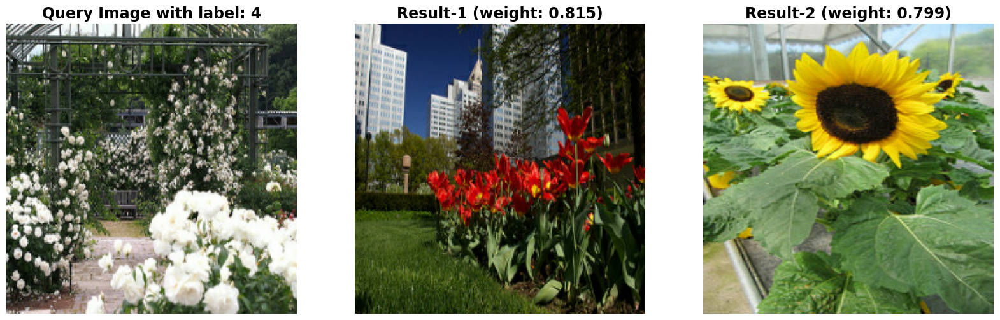

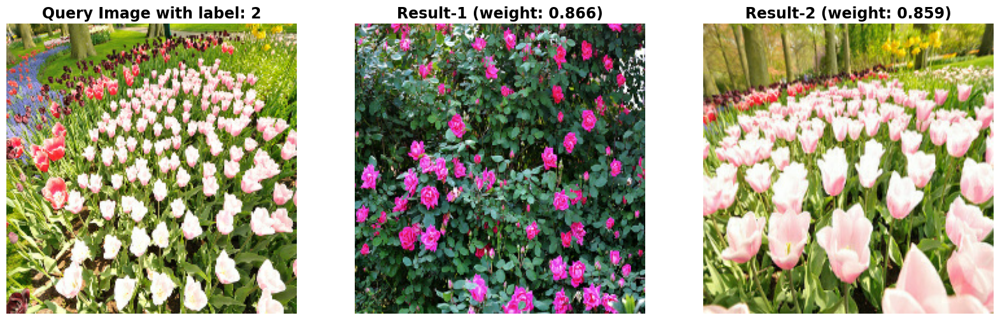

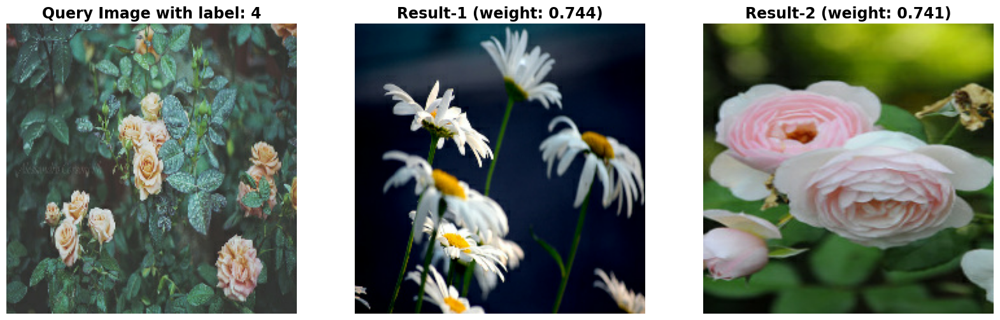

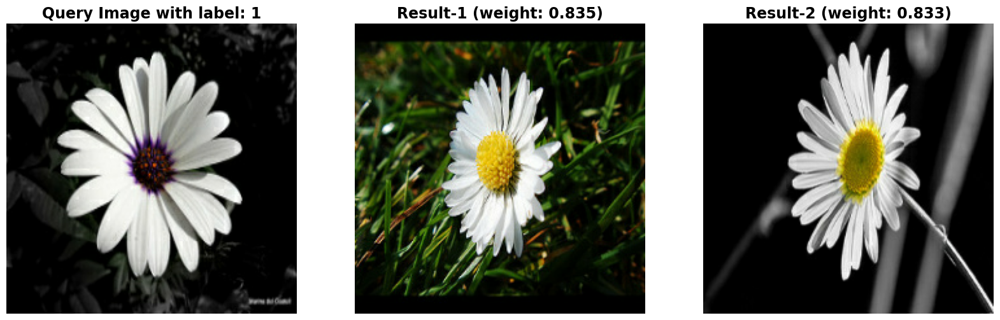

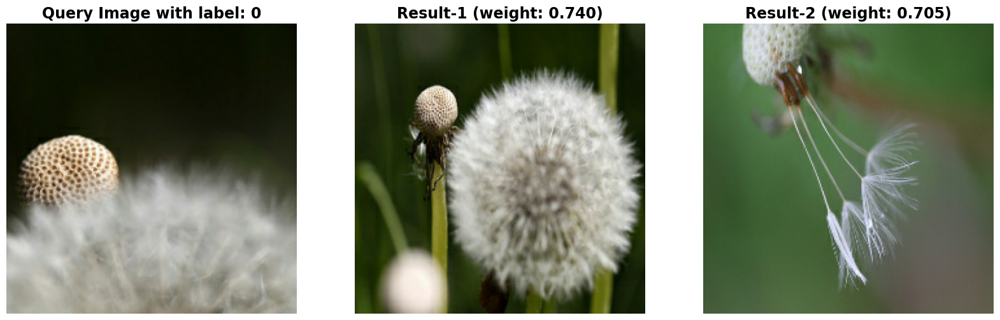

In [75]:
for idx in range(15):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 3, 1)
    plt.imshow(sample[0]["image"][idx])
    plt.title(f"Query Image with label: {int(sample[1][idx])}", fontsize=17)
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(sample[0]["NL_nbr_0_image"][idx])
    neighbor_one_weight = float(sample[0]["NL_nbr_0_weight"][idx].numpy())
    plt.title(f"Result-1 (weight: {neighbor_one_weight:.3f})", fontsize=17)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(sample[0]["NL_nbr_1_image"][idx])
    neighbor_two_weight = float(sample[0]["NL_nbr_1_weight"][idx].numpy())
    plt.title(f"Result-2 (weight: {neighbor_two_weight:.3f})", fontsize=17)
    plt.axis("off")

    
    plt.show()
    #plt.close('all')

### T-sne vizualization

In [28]:
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from tensorflow.keras.applications import *
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
import tensorflow_hub as hub

import tensorflow_addons as tfa


import matplotlib.pyplot as plt
import numpy as np
import time

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

C:\Users\samet\Anaconda3\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [30]:
#@title Define model
def conv_nn_model(img_input_shape: tuple) -> tf.keras.Model():
  """Simple Conv2D Neural Network.
    Args:
      img_input_shape: An (mxnxo) tuple defining the input image shape. 
    Returns:
      model: An instance of tf.keras.Model.
  """
  model = tf.keras.models.Sequential([
      tf.keras.Input(input_shape, name=IMAGE_INPUT_NAME),
    
      tf.keras.layers.Conv2D(16, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),    
      tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(128, activation='relu'),
      #tf.keras.layers.Dropout(rate=0.2),
    # Note to adjust output layer for number of classes
      tf.keras.layers.Dense(5, activation='softmax')])
  return model

In [31]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [32]:
input_shape = (IMG_SIZE,IMG_SIZE,3)
baseline_model = conv_nn_model(img_input_shape=input_shape)
baseline_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 64)       0

In [61]:
# mapping dataset to an appropriate format for training and t-sne 

train_dataset = train.shuffle(5000).batch(BATCH_SIZE).map(examples_to_dict)
test_dataset = test.batch(BATCH_SIZE).map(examples_to_dict)
val_dataset = validation.batch(BATCH_SIZE).map(examples_to_dict)

val_dataset = validation.batch(BATCH_SIZE).map(examples_to_dict)
val_dataset2=val_dataset.map(normalize).map(examples_to_tuples)

train_dataset2=train_dataset.map(examples_to_tuples)
test_dataset2=test_dataset.map(examples_to_tuples)
val_dataset2=val_dataset.map(examples_to_tuples)

train_dataset2=train_dataset.map(normalize).map(examples_to_tuples)
test_dataset2=test_dataset.map(normalize).map(examples_to_tuples)
val_dataset2=val_dataset.map(normalize).map(examples_to_tuples)

In [42]:
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
N_EPOCHS = 20
baseline_model.compile(
    optimizer='adam', 
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])
baseline_history = baseline_model.fit(train_dataset2, validation_data=validation_dataset2, epochs=N_EPOCHS, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
23/23 [==============================] - 5s 121ms/step - loss: 1.4874 - accuracy: 0.3379 - val_loss: 1.2808 - val_accuracy: 0.4278
Epoch 2/20
23/23 [==============================] - 1s 38ms/step - loss: 1.2016 - accuracy: 0.4886 - val_loss: 1.1785 - val_accuracy: 0.4905
Epoch 3/20
23/23 [==============================] - 1s 37ms/step - loss: 1.0862 - accuracy: 0.5477 - val_loss: 1.1215 - val_accuracy: 0.5123
Epoch 4/20
23/23 [==============================] - 1s 38ms/step - loss: 0.9680 - accuracy: 0.6240 - val_loss: 1.0150 - val_accuracy: 0.5804
Epoch 5/20
23/23 [==============================] - 1s 38ms/step - loss: 0.8448 - accuracy: 0.6794 - val_loss: 1.0092 - val_accuracy: 0.5777
Epoch 6/20
23/23 [==============================] - 1s 37ms/step - loss: 0.7406 - accuracy: 0.7330 - val_loss: 0.9353 - val_accuracy: 0.6131
Epoch 7/20
23/23 [==============================] - 1s 37ms/step - loss: 0.6167 - accuracy: 0.7838 - val_loss: 0.9334 - val_accuracy: 0.6376
Epoch 8/20
2

the sample shape has to be (none,.,.,.)

C:\Users\samet\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\samet\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\samet\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


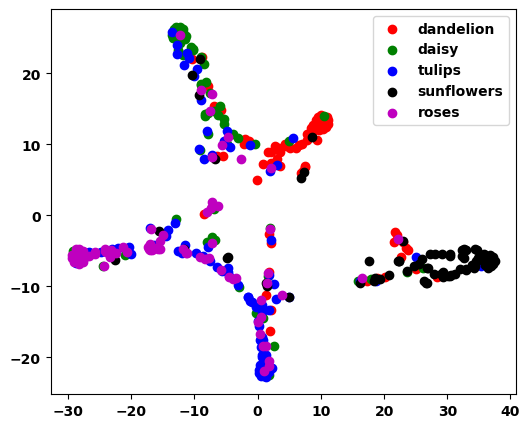

In [59]:
# t-sne vizualization

CLASSES = 'dandelion', 'daisy', 'tulips', 'sunflowers', 'roses'


colors = 'r', 'g', 'b', 'k', 'm'


##### PARAMS#############################
data_set = validation_dataset2  # DATASET TO VIZ : adv_val_dataset2_s  ,  adv_val_dataset2,  val_dataset2, test_dataset2
model_viz = baseline_model   # WHICH MODEL TO GET PREDICTIONS. model, graph_reg_model, graph_reg_model2, graph_reg_model3, feature_extractor, adv_reg_model.base_model
CLASSES = CLASSES       # CLASSES: REGULAR LABELS. CLASSES2: NEW LABEL ASSIGNED TO ADV EXAMPLES
target_ids = np.arange(5)       # 6 FOR INCLUDING ADV LABELS. 5 FOR REGULAR LABELS
colors = colors               # colors2 includes color for adv examples. colors only colors for reg classes

validation_labels = [label
    for _, labels in data_set for label in labels
]

#############################################################################
validation_features = model_viz.predict(data_set)
normalized_features = validation_features / np.linalg.norm(validation_features)

tsne_results = TSNE(n_components=2).fit_transform(normalized_features)


#tsne_results = TSNE(n_components=2).fit_transform(validation_features)
tsne = TSNE(n_components=2, random_state=0,  perplexity=20.0, learning_rate='auto',  init='pca', n_iter=100000, metric='euclidean', verbose=0,  method='barnes_hut')
#tsne = TSNE(n_components=2)
X_2d = tsne.fit_transform(validation_features)

plt.figure(figsize=(6, 5))


for i, c, label in zip(target_ids, colors, CLASSES): # in ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']: # CLASSES:
    plt.scatter(X_2d[validation_labels==i, 0],
                X_2d[validation_labels==i, 1],
                c=c, #validation_labels,
                label = label)
plt.legend()
plt.show()

